# Project 1 -- Feature Engineering
## CalTech AIML Bootcamp -- Applied Data Science with Python
### Weston Mauz
#### September 17, 2022

# Problem Statement

Using the dataset, find the factors that influence price negotiations while buying a house.

# Data & Library Import

In [373]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
#pd.options.display.max_rows = None

In [374]:
df = pd.read_csv('Project_dataset_Feature_Engineering/PEP1.csv')

# Data Wrangling

In [375]:
type(df)

pandas.core.frame.DataFrame

In [376]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,KitchenQual,TotRmsAbvGrd,Functiol,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [377]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [378]:
df.shape

(1460, 81)

In [379]:
a = df.dtypes
category_count = 0
numerical_count = 0
for i in a:
    if i == 'object':
        category_count+=1
    else:
        numerical_count+=1
        
print(f'categorical: {category_count}')
print(f'numerical: {numerical_count}')

categorical: 43
numerical: 38


### Observation

This dataset has:
- 81 features (43 categorical, 38 numerical)
- 1460 observations

The target variable is ['SalePrice']

In [380]:
df.isna()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,KitchenQual,TotRmsAbvGrd,Functiol,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
5,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [381]:
null_sorted = df.isna().sum(axis=0).sort_values(ascending=False)
null_sorted[null_sorted>0]

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageCond        81
GarageType        81
GarageFinish      81
GarageQual        81
BsmtFinType2      38
BsmtExposure      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64

In [382]:
null_mean_sorted = df.isnull().mean().sort_values(ascending=False)
null_mean_sorted[null_mean_sorted>0]

PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
FireplaceQu     0.472603
LotFrontage     0.177397
GarageYrBlt     0.055479
GarageCond      0.055479
GarageType      0.055479
GarageFinish    0.055479
GarageQual      0.055479
BsmtFinType2    0.026027
BsmtExposure    0.026027
BsmtQual        0.025342
BsmtCond        0.025342
BsmtFinType1    0.025342
MasVnrArea      0.005479
MasVnrType      0.005479
Electrical      0.000685
dtype: float64

### Observation

Variables w/ Null Values

- PoolQC          (1453)
- MiscFeature     (1406)
- Alley           (1369)
- Fence           (1179)
- FireplaceQu      (690)
- LotFrontage      (259)
- GarageYrBlt       (81)
- GarageCond        (81)
- GarageType        (81)
- GarageFinish      (81)
- GarageQual        (81)
- BsmtFinType2      (38)
- BsmtExposure      (38)
- BsmtQual          (37)
- BsmtCond          (37)
- BsmtFinType1      (37)
- MasVnrArea         (8)
- MasVnrType         (8)
- Electrical         (1)


### Observation

The Variables ['PoolQC'], ['MiscFeature'], ['Alley'], ['Fence'] will most likely be dropped because they are missing more than 80% of their data

In [383]:
#df.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence'], inplace=True)

In [384]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Identify Unique Values

In [385]:
# Constant features

df.nunique().sort_values(ascending=False)

Id               1460
LotArea          1073
GrLivArea         861
BsmtUnfSF         780
1stFlrSF          753
TotalBsmtSF       721
SalePrice         663
BsmtFinSF1        637
GarageArea        441
2ndFlrSF          417
MasVnrArea        327
WoodDeckSF        274
OpenPorchSF       202
BsmtFinSF2        144
EnclosedPorch     120
YearBuilt         112
LotFrontage       110
GarageYrBlt        97
ScreenPorch        76
YearRemodAdd       61
Neighborhood       25
LowQualFinSF       24
MiscVal            21
3SsnPorch          20
Exterior2nd        16
MSSubClass         15
Exterior1st        15
TotRmsAbvGrd       12
MoSold             12
OverallQual        10
Condition1          9
OverallCond         9
SaleType            9
PoolArea            8
RoofMatl            8
HouseStyle          8
BedroomAbvGr        8
Condition2          8
Functiol            7
GarageType          6
SaleCondition       6
Heating             6
BsmtFinType2        6
BsmtFinType1        6
RoofStyle           6
Foundation

### Observation

- The data appears to have 3 binary features ['Street', 'Central Air', 'Utilities']
- ['Id'] Appears to be ordinal, which would lead to the variable being dropped
- ['OverallQual','OverallCond'] appear to be categorical, due to a rating classification between 1 & 10. They will be treated as numerical for this study
- ['YearBuilt','YearRemodAdd','MoSold', 'YrSold'] are dates, meaning they could be categorical or numerical. They will be treated as numerical for this study


In [386]:
for col in df:
    print(col)
    print(df[col].unique())

Id
[   1    2    3 ... 1458 1459 1460]
MSSubClass
[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
MSZoning
['RL' 'RM' 'C (all)' 'FV' 'RH']
LotFrontage
[ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
LotArea
[ 8450  9600 11250 ... 17217 13175  9717]
Street
['Pave' 'Grvl']
Alley
[nan 'Grvl' 'Pave']
LotShape
['Reg' 'IR1' 'IR2' 'IR3']
LandContour
['Lvl' 'Bnk' 'Low' 'HLS']
Utilities
['AllPub' 'NoSeWa']
LotConfig
['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope
['Gtl' 

## Separate Numerical & Categorical Variables

In [387]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [389]:
df_numerical = df.select_dtypes(include=['int64','float64'])
#df_numerical.drop(columns=df_categorical_extras, inplace = True)
df_numerical

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [390]:
df_categorical = df.select_dtypes(exclude=['int64','float64'])
df_categorical

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


In [391]:
df_numerical.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 38 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   OverallQual    1460 non-null   int64  
 5   OverallCond    1460 non-null   int64  
 6   YearBuilt      1460 non-null   int64  
 7   YearRemodAdd   1460 non-null   int64  
 8   MasVnrArea     1452 non-null   float64
 9   BsmtFinSF1     1460 non-null   int64  
 10  BsmtFinSF2     1460 non-null   int64  
 11  BsmtUnfSF      1460 non-null   int64  
 12  TotalBsmtSF    1460 non-null   int64  
 13  1stFlrSF       1460 non-null   int64  
 14  2ndFlrSF       1460 non-null   int64  
 15  LowQualFinSF   1460 non-null   int64  
 16  GrLivArea      1460 non-null   int64  
 17  BsmtFullBath   1460 non-null   int64  
 18  BsmtHalf

In [392]:
df_categorical.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 43 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSZoning       1460 non-null   object
 1   Street         1460 non-null   object
 2   Alley          91 non-null     object
 3   LotShape       1460 non-null   object
 4   LandContour    1460 non-null   object
 5   Utilities      1460 non-null   object
 6   LotConfig      1460 non-null   object
 7   LandSlope      1460 non-null   object
 8   Neighborhood   1460 non-null   object
 9   Condition1     1460 non-null   object
 10  Condition2     1460 non-null   object
 11  BldgType       1460 non-null   object
 12  HouseStyle     1460 non-null   object
 13  RoofStyle      1460 non-null   object
 14  RoofMatl       1460 non-null   object
 15  Exterior1st    1460 non-null   object
 16  Exterior2nd    1460 non-null   object
 17  MasVnrType     1452 non-null   object
 18  ExterQual      1460 non-null

### Observation

- The numerical and categorical data was separated based on data types

## Numerical Variable EDA

### Skew & Distribution

In [393]:
numerical_sorted_sum = df_numerical.isna().sum(axis=0).sort_values(ascending=False)
numerical_sorted_sum[numerical_sorted_sum>0]

LotFrontage    259
GarageYrBlt     81
MasVnrArea       8
dtype: int64

In [394]:
numerical_sorted = df_numerical.isna().mean(axis=0).sort_values(ascending=False)
numerical_sorted[numerical_sorted>0]

LotFrontage    0.177397
GarageYrBlt    0.055479
MasVnrArea     0.005479
dtype: float64

In [395]:
df_numerical.nunique()

Id               1460
MSSubClass         15
LotFrontage       110
LotArea          1073
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
MasVnrArea        327
BsmtFinSF1        637
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
1stFlrSF          753
2ndFlrSF          417
LowQualFinSF       24
GrLivArea         861
BsmtFullBath        4
BsmtHalfBath        3
FullBath            4
HalfBath            3
BedroomAbvGr        8
KitchebvGr          4
TotRmsAbvGrd       12
Fireplaces          4
GarageYrBlt        97
GarageCars          5
GarageArea        441
WoodDeckSF        274
OpenPorchSF       202
EnclosedPorch     120
3SsnPorch          20
ScreenPorch        76
PoolArea            8
MiscVal            21
MoSold             12
YrSold              5
SalePrice         663
dtype: int64

In [396]:
for col in df_numerical:
    print(col)
    print(df_numerical[col].unique())

Id
[   1    2    3 ... 1458 1459 1460]
MSSubClass
[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
LotFrontage
[ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
LotArea
[ 8450  9600 11250 ... 17217 13175  9717]
OverallQual
[ 7  6  8  5  9  4 10  3  1  2]
OverallCond
[5 8 6 7 4 2 3 9 1]
YearBuilt
[2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 197

In [397]:
pd.set_option('display.max_columns', None)
df_numerical.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Observations -- Skew & Distribution

- ['Id'] mean & median are the same, giving a symetrical normal distribution. This is an ordinal variable with a unique value for each of the observations, making this variable irrelevant
- ['MSSubClass'] has left tail (skewness), having a mean greater than the median. Has 15 unique values that appear as if they could be categorical, due to being a class system -- Will be treated as numerical for this analysis. Scale lies within 3 orders of magnitude
- ['LotFrontage'] has a mostly normal distribution with a slight left tail (skewness). 110 unique values -- numerical. Scale lies within 3 orders of magnitude.
- ['LotArea'] has left tail (skewness), 1073 unique values from 1300 to 215245. 6 orders of magnitude.
- ['OverallQual'] has a normal distribution with a small left tail. 10 unique Values from 1 to 10. 1 order of magnitude
- ['OverallCond'] has a left tail. 9 unique values from 1 to 9. 1 order of magnitude
- ['YearBuilt'] has a normal distrubtion with a small right tail. 112 unique values from 1872 to 2010. These are years, therefore date-related. They will be treated as numerical instead of cateogrical for this study. 4 orders of magnitude
- [YearRemodAdd'] has a right tail. 61 unique values from 1950 to 2010. These are years, therefore date-related. They will be treated as numerical instead of cateogrical for this study. 4 orders of magnitude
- ['MasVnrArea'] Has an extreme left tail. 327 unique values from 0 to 1600. 4 orders of magnitude.
- ['BsmtFinSf1'] has left tail. 637 unique values from 0 to 5644. 4 orders of magnitude
- ['BsmtFinSf2'] has extreme left tail. 144 unique values from 0 to 1474. 4 orders of magnitude
- ['BsmtUnfSF'] has left tail. 780 unique values from 0 to 2336. 4 orders of magnitude
- ['TotalBsmtSF'] has left tail. 721 unique values from 0 to 6110. 4 orders of magnitude
- ['1stFlrSF'] has right tail. 753 unique values from 334 to 4692. 4 orders of magnitude
- ['2ndFlrSF'] has extreme left tail. 417 unique values from 0 to 2065. 4 order of magntiude
- ['LowQualFinSF'] has extreme left tail. 24 unique values from 0 to 572. 3 orders of magnitude
- ['GrLivArea'] has normal distribution with small left tail. 861 unique values from 334 to 5642. 4 orders of magnitude.
- ['BsmtFullBath'] has left tail. 4 unique values from 0 to 3. 1 order of magnitude
- ['BsmtHalfBath'] has left tail. 3 unique values from 0 to 2. 1 order of magnitude
- ['FullBath'] has right tail. 4 unique values from 0 to 3. 1 order of magnitude
- ['HalfBath'] has left tail. 3 unique values from 0 to 2. 1 order of magnitude
- ['BedroomAbvGr'] has right tail. 8 unique values from 0 to 8. 1 order of magnitude
- ['KitchebvGr'] normal distribution with small left tail. 4 unique values from 0 to 3. 1 order of magnitude
- ['TotRmsAbvGrd'] normal distribution with small left tail. 12 unique values from 2 to 14. 2 order of magnitude
- ['Fireplaces'] has right tail. 4 unique values from 0 to 3. 1 order of magnitude.
- ['GarageYrBlt'] normal distribution with small right tail. 97 unique values from 1900 to 2010. These are years, therefore date-related. They will be treated as numerical instead of cateogrical for this study. 4 orders of magnitude
- ['GarageCars'] normal distribution with small right tail. 5 unique values from 0 to 4. 1 order of magnitude
- ['GarageArea'] normal distribution with small right tail. 441 unique values from 0 to 1418. 4 orders of magnitude
- ['WoodDeckSF'] extreme left tail distribution. 274 unique values from 0 to 857. 3 orders of magnitude
- ['OpenPorchSF'] left tail. 202 unique values from 0 to 547. 3 order of magnitude
- ['EnclosedPorch'] extreme left tail. 120 unique values from 0 to 552. 3 orders of magnitude
- ['3SsnPorch'] extreme left tail. 20 unique values from 0 to 508. 3 orders of magnitude
- ['ScreenPorch'] extreme left tail. 76 unique values from 0 to 480. 3 orders of magnitude
- ['PoolArea'] extreme left tail. 8 unique values from 0 to 738. 3 orders of magnitude
- ['MiscVal'] extreme left tail. 21 unique values from 0 to 15500. 5 orders of magnitude
- ['MoSold'] normal distribution with small left tail. 12 unique values from 1 to 12. These are months, therefore date-related. They will be treated as numerical instead of cateogrical for this study. 2 orders of magnitude
- ['YrSold'] normal distribution with small right tail. 5 unique values from 2006 to 2010. These are years, therefore date-related. They will be treated as numerical instead of cateogrical for this study. 4 orders of magnitude
- ['SalePrice'] This is the target variable. Has a left tail. 663 unique values from 34900 to 755000. 6 orders of magnitude.

In [398]:
df_numerical.skew().sort_values(ascending=False)

MiscVal          24.476794
PoolArea         14.828374
LotArea          12.207688
3SsnPorch        10.304342
LowQualFinSF      9.011341
KitchebvGr        4.488397
BsmtFinSF2        4.255261
ScreenPorch       4.122214
BsmtHalfBath      4.103403
EnclosedPorch     3.089872
MasVnrArea        2.669084
OpenPorchSF       2.364342
LotFrontage       2.163569
SalePrice         1.882876
BsmtFinSF1        1.685503
WoodDeckSF        1.541376
TotalBsmtSF       1.524255
MSSubClass        1.407657
1stFlrSF          1.376757
GrLivArea         1.366560
BsmtUnfSF         0.920268
2ndFlrSF          0.813030
OverallCond       0.693067
TotRmsAbvGrd      0.676341
HalfBath          0.675897
Fireplaces        0.649565
BsmtFullBath      0.596067
OverallQual       0.216944
MoSold            0.212053
BedroomAbvGr      0.211790
GarageArea        0.179981
YrSold            0.096269
FullBath          0.036562
Id                0.000000
GarageCars       -0.342549
YearRemodAdd     -0.503562
YearBuilt        -0.613461
G

In [602]:
# Too many variables to create a readable heatmap, so they were broken down into a table
#sns.heatmap(df_numerical.corr(method='spearman'), annot=True)

In [400]:
numerical_correlations = df_numerical.corr().abs()

numerical_correlations = numerical_correlations.unstack()
numerical_correlations_sorted = numerical_correlations.sort_values(ascending=False)
numerical_correlations_sorted[(numerical_correlations_sorted<1) & (numerical_correlations_sorted>0.6)]

GarageArea    GarageCars      0.882475
GarageCars    GarageArea      0.882475
GarageYrBlt   YearBuilt       0.825667
YearBuilt     GarageYrBlt     0.825667
GrLivArea     TotRmsAbvGrd    0.825489
TotRmsAbvGrd  GrLivArea       0.825489
TotalBsmtSF   1stFlrSF        0.819530
1stFlrSF      TotalBsmtSF     0.819530
OverallQual   SalePrice       0.790982
SalePrice     OverallQual     0.790982
              GrLivArea       0.708624
GrLivArea     SalePrice       0.708624
2ndFlrSF      GrLivArea       0.687501
GrLivArea     2ndFlrSF        0.687501
TotRmsAbvGrd  BedroomAbvGr    0.676620
BedroomAbvGr  TotRmsAbvGrd    0.676620
BsmtFullBath  BsmtFinSF1      0.649212
BsmtFinSF1    BsmtFullBath    0.649212
YearRemodAdd  GarageYrBlt     0.642277
GarageYrBlt   YearRemodAdd    0.642277
SalePrice     GarageCars      0.640409
GarageCars    SalePrice       0.640409
GrLivArea     FullBath        0.630012
FullBath      GrLivArea       0.630012
GarageArea    SalePrice       0.623431
SalePrice     GarageArea 

### Observations

- ['GarageArea'] & ['GarageCars'] are highly correlated (0.88) to each other, meaning one of them will likely be dropped from the analysis
- ['GarageYrBuilt'] & ['YearBuilt'] are highly correlated (0.83), meaning one of them will likely be dropped
- ['GrLivArea'] & ['TotRmsAbvGrd'] are highly correlated (0.83), meaning one of them will likely be dropped
- ['2ndFlrSF'] & ['GrLivArea'] are highly correlated (0.69), meaning one of them will likely be dropped
- ['TotRmsAbvGrd'] & ['BedroomAbvGr'] are highly correlated (0.68), meaning one of them will likely be dropped
- ['BsmtFullBath'] & ['BsmtFinSF1  ']    (0.649212) One will likely be dropped
- ['YearRemodAdd'] & ['GarageYrBlt ']    (0.642277)
- ['GarageCars  '] & ['SalePrice   ']    (0.640409) Appears to be a significant variable in predicting sale price of a house
- ['GrLivArea   '] & ['FullBath    ']    (0.630012)
- ['GarageArea  '] & ['SalePrice   ']    (0.623431) Appears to be a significant variable in predicting sale price of a house
- ['2ndFlrSF    '] & ['TotRmsAbvGrd']    (0.616423)
- ['TotalBsmtSF '] & ['SalePrice   ']    (0.613581) Appears to be a significant variable in predicting sale price of a house
- ['HalfBath    '] & ['2ndFlrSF    ']    (0.609707)
- ['1stFlrSF'] & ['SalePrice   ']    (0.605852) Appears to be a significant variable in predicting sale price of a house
- ['OverallQual '] & ['GarageCars  ']    (0.600671)

### Missing Value Treatment

In [401]:
numerical_sorted_sum = df_numerical.isna().sum(axis=0).sort_values(ascending=False)
numerical_sorted_sum[numerical_sorted_sum>0]

LotFrontage    259
GarageYrBlt     81
MasVnrArea       8
dtype: int64

In [402]:
numerical_sorted = df_numerical.isna().mean(axis=0).sort_values(ascending=False)
numerical_sorted[numerical_sorted>0]

LotFrontage    0.177397
GarageYrBlt    0.055479
MasVnrArea     0.005479
dtype: float64

### Observations

- Lot frontage is missing 259 values (17.7%)
- GarageYrBlt is missing 81 values (5.5%)
- MasVnrArea is missing 8 values (.5%)

**None of these values will be dropped, as there is less than 80% of the data missing -- They will be interpolated**

Text(0.5, 1.0, 'Quantifying Missing Data')

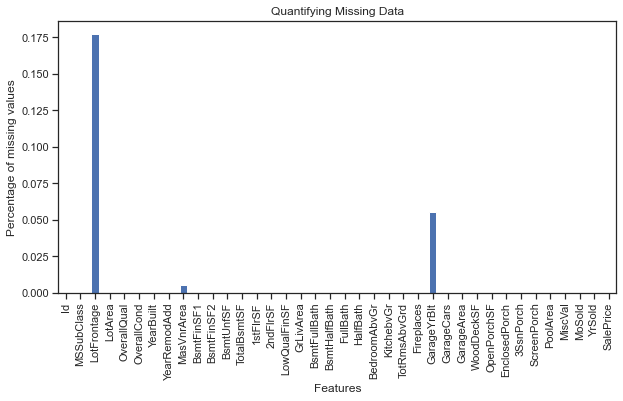

In [403]:
df_numerical.isnull().mean().plot.bar(figsize=(10,5))
plt.ylabel('Percentage of missing values')
plt.xlabel('Features')
plt.title('Quantifying Missing Data')

In [477]:
# Split in train and validation

from sklearn.model_selection import train_test_split

y = df_numerical['SalePrice']
X = df_numerical.drop(columns=['SalePrice','Id'])

X_train_num, X_val_num, y_train_num, y_val_num = train_test_split(X,y, test_size=0.33, random_state=42)

In [478]:
# Numerical imputation

from feature_engine.imputation import MeanMedianImputer

# Using Median Method (default)
# Using this method because LotFrontage & GarageYrBlt are numerical varaibles & mostly normal distibutions, making 'mean' the most applicable. 
# MasVnrArea has a strong left skew, but is only missing 8 values, compared to 259 & 81, so this imputation method seems best

num_imputer = MeanMedianImputer()
num_imputer.fit(X_train_num)

X_train_num = num_imputer.transform(X_train_num)
#X_val = num_imputer.transform(X_val)

In [491]:
X_train_num.isna().sum(axis=0)

MSSubClass       0
LotFrontage      0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchebvGr       0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
dtype: int64

### Observations

Missing Values:

- LotFrontage (259) 
- GarageYrBlt  (81)
- MasVnrArea    (8)

All of these were imputed using MeanMedianImputer -- Now, no missing values exist in X_train_num for numerical values

### Plot Distribution & Density

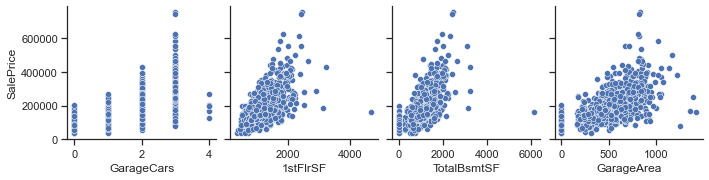

In [407]:
#sns.kdeplot(df_numerical['GarageCars'], hue=df_numerical['SalePrice'])
#sns.pairplot(train, hue='Survived')

sns.pairplot(
    df_numerical,
    x_vars=["GarageCars", '1stFlrSF', 'TotalBsmtSF', 'GarageArea'],
    y_vars=["SalePrice"],
)

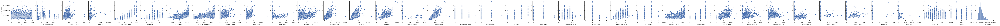

In [408]:
sns.set(style="ticks", color_codes=True)
g2 = sns.pairplot(data=df_numerical,
                  y_vars=['SalePrice'])

import matplotlib.pyplot as plt
plt.show()

### Observation

- Created a pairplot to show the distribution of the most highly correlated values to SalePrice -- All of which show a positive correlation
- Too many variables to run the pairplot on all variables

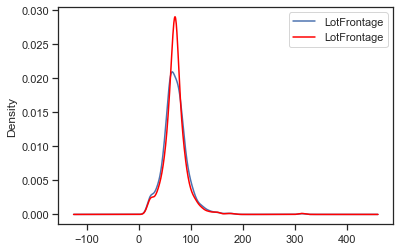

In [442]:
fig = plt.figure()
ax = fig.add_subplot(111)
df_numerical['LotFrontage'].plot(kind='kde', ax=ax)
X_train_num['LotFrontage'].plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

# sns.displot(X_train['LotFrontage'])

### Observation

- Distribution remained the same after missing data imputation for ['LotFrontage']

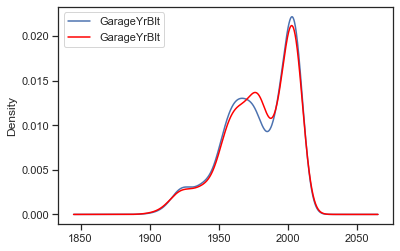

In [443]:
fig = plt.figure()
ax = fig.add_subplot(111)
df_numerical['GarageYrBlt'].plot(kind='kde', ax=ax)
X_train_num['GarageYrBlt'].plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

### Observation

- Distribution remained the same after missing data imputation for ['GarageYrBlt']

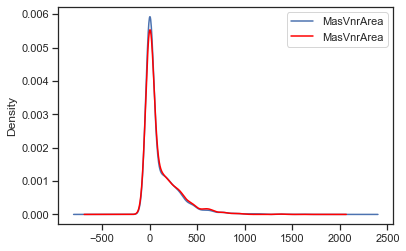

In [444]:
fig = plt.figure()
ax = fig.add_subplot(111)
df_numerical['MasVnrArea'].plot(kind='kde', ax=ax)
X_train_num['MasVnrArea'].plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

### Observation

- Distribution remained the same after missing data imputation for ['MasVnrArea']

## Categorical Variable EDA

In [412]:
df_categorical

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


### Missing Value Treatment

In [413]:
df_categorical.nunique()

MSZoning          5
Street            2
Alley             2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functiol          7
FireplaceQu       5
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
PoolQC            3
Fence             4
MiscFeature       4
SaleType          9
SaleCondition     6
dtype: int64

### Observation

- ['Street'], ['Alley'], ['Utilities'], & ['CentralAir'] are binary features 

In [414]:
for col in df_categorical:
    print(col)
    print(df_categorical[col].unique())

MSZoning
['RL' 'RM' 'C (all)' 'FV' 'RH']
Street
['Pave' 'Grvl']
Alley
[nan 'Grvl' 'Pave']
LotShape
['Reg' 'IR1' 'IR2' 'IR3']
LandContour
['Lvl' 'Bnk' 'Low' 'HLS']
Utilities
['AllPub' 'NoSeWa']
LotConfig
['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope
['Gtl' 'Mod' 'Sev']
Neighborhood
['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'mes' 'SawyerW' 'IDOTRR' 'MeadowV'
 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill' 'Blmngtn'
 'BrDale' 'SWISU' 'Blueste']
Condition1
['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2
['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType
['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle
['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle
['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl
['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTile']
Exterior1st
['VinylSd' 'MetalSd' '

In [415]:
categorical_sorted_sum = df_categorical.isna().sum(axis=0).sort_values(ascending=False)
categorical_sorted_sum[categorical_sorted_sum>0]

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
GarageType        81
GarageCond        81
GarageQual        81
GarageFinish      81
BsmtFinType2      38
BsmtExposure      38
BsmtFinType1      37
BsmtQual          37
BsmtCond          37
MasVnrType         8
Electrical         1
dtype: int64

In [416]:
categorical_sorted_mean = df_categorical.isna().mean(axis=0).sort_values(ascending=False)
categorical_sorted_mean[categorical_sorted_mean>0]

PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
FireplaceQu     0.472603
GarageType      0.055479
GarageCond      0.055479
GarageQual      0.055479
GarageFinish    0.055479
BsmtFinType2    0.026027
BsmtExposure    0.026027
BsmtFinType1    0.025342
BsmtQual        0.025342
BsmtCond        0.025342
MasVnrType      0.005479
Electrical      0.000685
dtype: float64

Text(0.5, 1.0, 'Quantifying Missing Data')

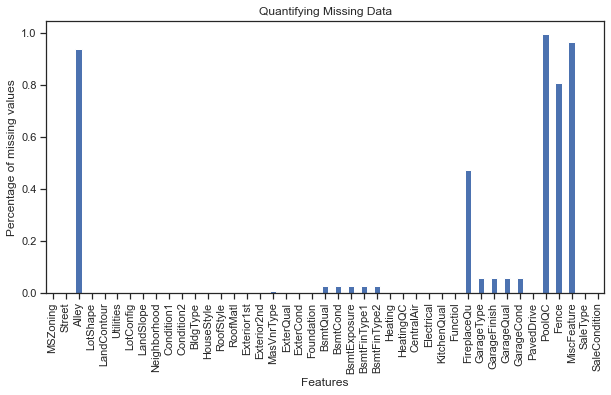

In [417]:
df_categorical.isnull().mean().plot.bar(figsize=(10,5))
plt.ylabel('Percentage of missing values')
plt.xlabel('Features')
plt.title('Quantifying Missing Data')

### Observation

- ['PoolQC'], ['MiscFeature'], ['Alley'], & ['Fence'] are all missing more than 80% of their values, so they will be dropped for this analysis

Missing Values:

- PoolQC 1453
- MiscFeature      1406
- Alley            1369
- Fence            1179
- FireplaceQu       690
- GarageType         81
- GarageCond         81
- GarageQual         81
- GarageFinish       81
- BsmtFinType2       38
- BsmtExposure       38
- BsmtFinType1       37
- BsmtQual           37
- BsmtCond           37
- MasVnrType          8
- Electrical          1

In [418]:
df_categorical.describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,mes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


In [559]:
# Split in train and validation

from sklearn.model_selection import train_test_split

# y was previously defined in the numberical analysis
# y = df_numerical['SalePrice']
X_cat = df_categorical.drop(columns=['PoolQC','MiscFeature','Alley','Fence'])

X_train_cat, X_val_cat, y_train_cat, y_val_cat = train_test_split(X_cat,y, test_size=0.33, random_state=42)

In [560]:
# Categorical imputation

from feature_engine.imputation import CategoricalImputer

# Feature Enginer Categorical Imputer Used -- Replacing missing values with 'Missing' Labels
cat_imputer = CategoricalImputer()
cat_imputer.fit(X_train_cat)

X_train_cat = cat_imputer.transform(X_train_cat)
#X_val = cat_imputer.transform(X_val)

In [561]:
categorical_imputed_sorted_sum = X_train_cat.isna().sum(axis=0).sort_values(ascending=False)
categorical_imputed_sorted_sum

MSZoning         0
KitchenQual      0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
                ..
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
SaleCondition    0
Length: 39, dtype: int64

In [495]:
X_train_cat

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
615,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,mes,Feedr,Norm,1Fam,SFoyer,Gable,CompShg,MetalSd,MetalSd,BrkFace,TA,Gd,PConc,TA,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Missing,Attchd,RFn,TA,TA,Y,WD,Abnorml
613,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Missing,Missing,Missing,Missing,Missing,Y,New,Partial
1303,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Missing,Attchd,RFn,TA,TA,Y,WD,Normal
486,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,mes,Norm,Norm,1Fam,1Story,Hip,CompShg,MetalSd,MetalSd,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Missing,Attchd,RFn,TA,TA,Y,WD,Normal
561,RL,Pave,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,None,TA,TA,CBlock,Gd,TA,Av,ALQ,LwQ,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
308,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,CBlock,TA,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Missing,Detchd,Unf,TA,TA,Y,WD,Normal
461,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,SWISU,Feedr,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Sdng,None,Gd,Gd,PConc,Gd,Gd,No,ALQ,BLQ,GasA,Ex,Y,SBrkr,Gd,Typ,Missing,Detchd,RFn,TA,TA,Y,WD,Normal
1142,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Hip,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,BuiltIn,RFn,TA,TA,Y,New,Partial
730,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,CemntBd,CmentBd,None,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
1155,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Veenker,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood,None,Gd,Gd,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,Fa,Attchd,RFn,TA,TA,Y,WD,Normal


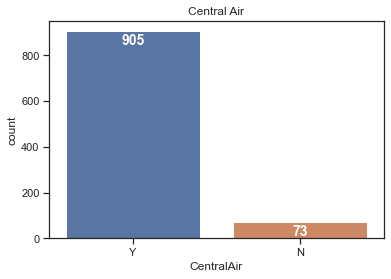

In [423]:
plt.figure(figsize=(6,4))
ax = sns.countplot(x='CentralAir', data=X_train_cat)
plt.xticks(np.arange(2), ['Y', 'N'])
plt.title('Central Air')

labels = (X_categorical_imputed['CentralAir'].value_counts())
for i, v in enumerate(labels):
    ax.text(i, v-60, str(v), horizontalalignment = 'center', size = 14, color = 'w', fontweight = 'bold')
plt.show()

Text(0.5, 1.0, 'Violin Plot 1st Floor Square Footage by SalePrice, Separated by Garage Car Size')

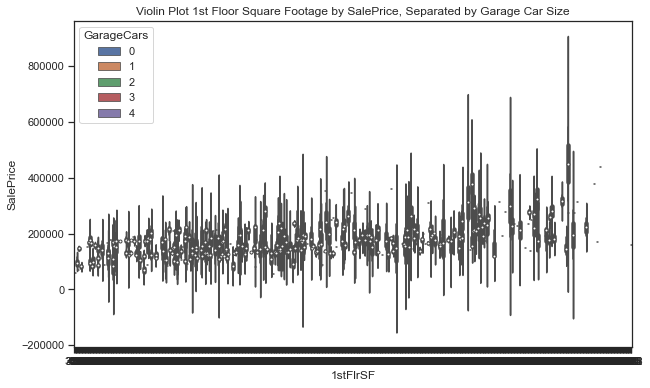

In [424]:
plt.figure(figsize=(10,6))
sns.violinplot(x="1stFlrSF",y='SalePrice',data=df, hue='GarageCars')
plt.title("Violin Plot 1st Floor Square Footage by SalePrice, Separated by Garage Car Size")
# Too many data points to view the hue of the graph

### Observation

- Unsure of how to do box plot with categorical data (asked for by the project) -- Will perform this when data is combined

## Combine numerical & categorical

### Numerical variable scaling

In [481]:
# Deal with outliers - Numerical
# Applying Winsorizer to handle numerical outliers

from feature_engine.outliers import Winsorizer

capper = Winsorizer(capping_method="iqr", tail="both")
capper.fit(X_train_num)

X_train_num = capper.transform(X_train_num)
#X_val = capper.transform(X_val)

In [482]:
X_train.skew()

0     0.071593
1     0.168234
2    -0.006377
3     0.019429
4     0.049015
6    -0.233219
7     0.334825
8    -0.427255
10   -0.260295
11    0.308521
13    0.259323
15    0.000733
16    0.371692
17    3.698977
18   -0.052033
19    0.544916
20    0.116671
24   -0.149133
25   -0.038619
27    0.153789
28   -0.047216
29    2.152809
31    3.007671
34   -0.031576
35    0.096043
36   -1.392874
38   -0.651941
39   -2.764897
41   -0.878870
42   -3.817028
43    0.023778
44   -2.077225
46   -1.781810
47   -0.639324
48   -1.327543
51    0.178885
53   -0.655854
54   -2.289084
55   -2.043363
56   -2.040740
57   -2.557910
58   -0.666292
59   -0.484943
60   -2.178968
62   -0.375816
63   -3.241936
64   -3.007671
65   -1.079677
66   -3.329040
67   -0.322549
68   -0.627430
69   -0.231850
70   -2.629658
71   -2.785330
72   -2.983818
73   -2.232902
74   -1.668831
dtype: float64

In [483]:
X_train.shape

(978, 57)

### Observation

- Numerical variables scaled before combining data, as winsorizer is meant for numerical outliers

### Categorical variable encoding

In [562]:
# Rare label encoder

from feature_engine.encoding import RareLabelEncoder

rare_encoder = RareLabelEncoder()
rare_encoder.fit(X_train_cat)

X_train_cat = rare_encoder.transform(X_train_cat)
#X_val = rare_encoder.transform(X_val)

In [563]:
# Label encoder

from feature_engine.encoding import CountFrequencyEncoder

count_encoder = CountFrequencyEncoder()
count_encoder.fit(X_train_cat)

X_train_cat = count_encoder.transform(X_train_cat)

### Observation

- Categorical values were encoded using rare-label encoder, then a count frequency encoder

In [564]:
X_train_cat

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
615,768,975,610,885,977,681,922,149,55,969,814,21,759,961,145,139,316,607,97,434,427,874,94,284,849,954,498,905,896,402,908,467,575,281,878,886,895,853,66
613,768,975,610,885,977,681,922,368,55,969,814,486,759,961,355,347,558,607,857,434,416,874,639,149,849,954,498,905,896,486,908,467,53,53,53,53,895,83,84
1303,768,975,610,885,977,681,922,54,841,969,814,486,759,961,355,347,316,327,857,434,416,874,145,283,849,954,498,905,896,402,908,467,575,281,878,886,895,853,802
486,768,975,610,885,977,681,922,149,841,969,814,486,195,961,145,139,316,607,857,418,427,874,639,149,849,954,281,905,896,486,908,467,575,281,878,886,895,853,802
561,768,975,610,885,977,681,47,368,841,969,814,486,759,961,149,137,558,607,857,418,416,874,145,149,28,954,161,905,896,486,908,210,575,281,878,886,895,853,802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,768,975,330,885,977,681,922,101,841,969,814,486,759,961,355,347,558,327,857,434,416,874,639,284,849,954,161,905,896,402,908,248,575,281,878,886,895,853,802
1130,768,975,610,885,977,681,922,368,841,969,814,99,759,961,124,92,558,607,857,100,427,874,639,102,849,954,281,905,896,402,22,210,265,404,878,886,895,853,802
1294,768,975,610,885,977,681,922,75,841,969,814,486,195,961,124,92,558,607,857,418,427,874,639,83,849,954,281,905,896,486,908,467,265,404,878,886,62,853,802
860,768,975,610,885,977,189,922,368,841,969,814,99,759,961,139,135,558,327,857,100,427,874,639,283,849,954,161,905,896,402,908,248,265,404,878,886,895,853,802


In [565]:
# 1. Basic methods - Correlated independent variables
# Applicable for categorical variables

from sklearn.feature_selection import chi2, SelectKBest

# Number of top features we want to keep
selectK = 10

selector = SelectKBest(chi2, k=selectK)
selector.fit(X_train_cat, y_train_cat)

X_train_cat_transformed = selector.transform(X_train_cat)
#X_test = selector.transform(X_test)

In [567]:
# This code was used to retrieve the column names of the the variables chosen from SelectKBest

selected_variables = selector.get_support(indices=True)
for i in range(len(a)):
   print(X_train_cat.columns[a[i]])

MSZoning
LotConfig
Neighborhood
Condition1
BldgType
RoofStyle
BsmtExposure
GarageType
SaleType
SaleCondition


### Observation

- chi 2 was used to determine the top 10 variables to keep from the categorical dataset.

The categorical variables chosen were:

- MSZoning
- LotConfig
- Neighborhood
- Condition1
- BldgType
- RoofStyle
- BsmtExposure
- GarageType
- SaleType
- SaleCondition

In [569]:
X_train_cat

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
615,768,975,610,885,977,681,922,149,55,969,814,21,759,961,145,139,316,607,97,434,427,874,94,284,849,954,498,905,896,402,908,467,575,281,878,886,895,853,66
613,768,975,610,885,977,681,922,368,55,969,814,486,759,961,355,347,558,607,857,434,416,874,639,149,849,954,498,905,896,486,908,467,53,53,53,53,895,83,84
1303,768,975,610,885,977,681,922,54,841,969,814,486,759,961,355,347,316,327,857,434,416,874,145,283,849,954,498,905,896,402,908,467,575,281,878,886,895,853,802
486,768,975,610,885,977,681,922,149,841,969,814,486,195,961,145,139,316,607,857,418,427,874,639,149,849,954,281,905,896,486,908,467,575,281,878,886,895,853,802
561,768,975,610,885,977,681,47,368,841,969,814,486,759,961,149,137,558,607,857,418,416,874,145,149,28,954,161,905,896,486,908,210,575,281,878,886,895,853,802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,768,975,330,885,977,681,922,101,841,969,814,486,759,961,355,347,558,327,857,434,416,874,639,284,849,954,161,905,896,402,908,248,575,281,878,886,895,853,802
1130,768,975,610,885,977,681,922,368,841,969,814,99,759,961,124,92,558,607,857,100,427,874,639,102,849,954,281,905,896,402,22,210,265,404,878,886,895,853,802
1294,768,975,610,885,977,681,922,75,841,969,814,486,195,961,124,92,558,607,857,418,427,874,639,83,849,954,281,905,896,486,908,467,265,404,878,886,62,853,802
860,768,975,610,885,977,189,922,368,841,969,814,99,759,961,139,135,558,327,857,100,427,874,639,283,849,954,161,905,896,402,908,248,265,404,878,886,895,853,802


In [570]:
X_train_cat.shape

(978, 39)

In [571]:
X_train_cat_transformed

array([[768, 681, 149, ..., 575, 853,  66],
       [768, 681, 368, ...,  53,  83,  84],
       [768, 681,  54, ..., 575, 853, 802],
       ...,
       [768, 681,  75, ..., 265, 853, 802],
       [768, 189, 368, ..., 265, 853, 802],
       [768, 681, 368, ..., 575, 853, 802]])

In [572]:
X_train_cat_transformed.shape

(978, 10)

In [575]:
X_train_cat_for_combine = X_train_cat[['MSZoning','LotConfig','Neighborhood','Condition1','BldgType','RoofStyle','BsmtExposure','GarageType','SaleType','SaleCondition']]

### Observation

- X_train_cat was modified to keep the chi2-determined top 10 variables in the datafram

In [576]:
X_train_cat_for_combine

,MSZoning,LotConfig,Neighborhood,Condition1,BldgType,RoofStyle,BsmtExposure,GarageType,SaleType,SaleCondition
615,768,681,149,55,814,759,94,575,853,66
613,768,681,368,55,814,759,639,53,83,84
1303,768,681,54,841,814,759,145,575,853,802
486,768,681,149,841,814,195,639,575,853,802
561,768,681,368,841,814,759,145,575,853,802
...,...,...,...,...,...,...,...,...,...,...
1095,768,681,101,841,814,759,639,575,853,802
1130,768,681,368,841,814,759,639,265,853,802
1294,768,681,75,841,814,195,639,265,853,802
860,768,189,368,841,814,759,639,265,853,802


In [577]:
X_train_combined = pd.concat([X_train_num, X_train_cat_for_combine], axis=1)

In [578]:
X_train_combined

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning,LotConfig,Neighborhood,Condition1,BldgType,RoofStyle,BsmtExposure,GarageType,SaleType,SaleCondition
615,85.0,80.0,8800.0,6.0,7.0,1963.0,1963.0,156.0,763.0,0.0,173.0,936.0,1054.0,0.0,0.0,1054.0,1.0,0.0,1.0,0.0,3.0,1.0,6.0,0.0,1963.0,2.0,480.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2010.0,768,681,149,55,814,759,94,575,853,66
613,20.0,70.0,8402.0,5.0,5.0,2007.0,2007.0,0.0,206.0,0.0,914.0,1120.0,1120.0,0.0,0.0,1120.0,0.0,0.0,1.0,0.0,3.0,1.0,6.0,0.0,1980.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0,12.0,2007.0,768,681,368,55,814,759,639,53,83,84
1303,20.0,73.0,8688.0,7.0,5.0,2005.0,2005.0,228.0,0.0,0.0,1616.0,1616.0,1616.0,0.0,0.0,1616.0,0.0,0.0,2.0,0.0,3.0,1.0,7.0,0.0,2005.0,3.0,834.0,208.0,59.0,0.0,0.0,0.0,0.0,0.0,4.0,2006.0,768,681,54,841,814,759,145,575,853,802
486,20.0,79.0,10289.0,5.0,7.0,1965.0,1965.0,168.0,836.0,0.0,237.0,1073.0,1073.0,0.0,0.0,1073.0,1.0,0.0,1.0,1.0,3.0,1.0,6.0,0.0,1965.0,2.0,515.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,2007.0,768,681,149,841,814,195,639,575,853,802
561,20.0,77.0,10010.0,5.0,5.0,1974.0,1975.0,0.0,1071.0,0.0,195.0,1389.0,1389.0,0.0,0.0,1389.0,1.0,0.0,1.0,0.0,2.0,1.0,6.0,1.0,1975.0,2.0,418.0,240.0,38.0,0.0,0.0,0.0,0.0,0.0,4.0,2006.0,768,681,368,841,814,759,145,575,853,802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,20.0,78.0,9317.0,6.0,5.0,2006.0,2006.0,0.0,24.0,0.0,1290.0,1314.0,1314.0,0.0,0.0,1314.0,0.0,0.0,2.0,0.0,3.0,1.0,6.0,1.0,2006.0,2.0,440.0,0.0,22.0,0.0,0.0,0.0,0.0,0.0,3.0,2007.0,768,681,101,841,814,759,639,575,853,802
1130,50.0,65.0,7804.0,4.0,3.0,1928.0,1950.0,0.0,622.0,0.0,500.0,1122.0,1328.0,653.0,0.0,1981.0,1.0,0.0,2.0,0.0,4.0,1.0,7.0,2.0,1981.0,2.0,576.0,431.0,44.0,0.0,0.0,0.0,0.0,0.0,12.0,2009.0,768,681,368,841,814,759,639,265,853,802
1294,20.0,60.0,8172.0,5.0,7.0,1955.0,1990.0,0.0,167.0,0.0,697.0,864.0,864.0,0.0,0.0,864.0,1.0,0.0,1.0,0.0,2.0,1.0,5.0,0.0,1957.0,2.0,572.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2006.0,768,681,75,841,814,195,639,265,853,802
860,50.0,55.0,7642.0,7.0,8.0,1918.0,1998.0,0.0,0.0,0.0,912.0,912.0,912.0,514.0,0.0,1426.0,0.0,0.0,1.0,1.0,3.0,1.0,7.0,1.0,1925.0,1.0,216.0,0.0,240.0,0.0,0.0,0.0,0.0,0.0,6.0,2007.0,768,189,368,841,814,759,639,265,853,802


In [579]:
X_train_combined.shape

(978, 46)

### Observation

- After keeping the top 10 categorical variables, there are now 46 variables in the dataframe

In [580]:
# Variance Stabilizing Transformations

from feature_engine.transformation import YeoJohnsonTransformer

yeo_trans = YeoJohnsonTransformer()
yeo_trans.fit(X_train_combined)

X_train_combined = yeo_trans.transform(X_train_combined)
#X_val = yeo_trans.transform(X_val)

In [581]:
# Scale

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train_combined)

X_train_combined = scaler.transform(X_train_combined)
#X_val = scaler.transform(X_val)

### Observation

- Combined data was transformed with yeoJohnson transformer
- Combined data was then scaled with the Standard Scalar

In [582]:
X_train

,0,1,2,3,4,6,7,8,10,11,13,15,16,17,18,19,20,24,25,27,28,29,31,34,35,36,38,39,41,42,43,44,46,47,48,51,53,54,55,56,57,58,59,60,62,63,64,65,66,67,68,69,70,71,72,73,74
0,0.938990,0.526571,-0.057790,-0.072698,1.269784,-1.108635,1.119995,0.836824,-0.802367,-0.212472,-0.881020,-0.957857,1.181882,-0.253378,-1.073877,-0.764726,0.156648,-0.799117,0.242447,0.936821,-1.099948,-0.393272,-0.302519,-0.469050,1.651643,0.522822,0.762418,0.324168,0.658053,0.246450,0.053682,-2.472816,0.448855,-1.892097,0.537083,-0.446469,0.765413,-2.660735,0.586571,0.523713,0.344954,-1.416096,0.834363,0.389799,0.928702,0.284012,0.302519,-0.479585,0.277655,0.988433,0.801375,-0.425586,0.337484,0.322238,0.304528,0.382807,-2.137244
1,-1.157938,0.086252,-0.144635,-0.811266,-0.472908,1.209494,-0.859904,0.095493,0.846232,0.197477,-0.881020,-0.774332,-0.834285,-0.253378,-1.073877,-0.764726,0.156648,-0.127915,-2.151448,-0.939046,0.451789,-0.393272,-0.302519,1.955759,-0.605469,0.522822,0.762418,0.324168,0.658053,0.246450,1.167813,-2.472816,0.448855,0.891007,0.537083,1.269488,0.765413,0.375753,0.586571,0.267625,0.344954,0.726003,-0.720862,0.389799,0.928702,0.284012,0.302519,0.848476,0.277655,0.988433,-1.756361,-2.230592,-2.962827,-3.103130,0.304528,-2.610211,-2.126990
2,-1.157938,0.222237,-0.081823,0.650253,-0.472908,1.053613,1.204030,-1.366342,1.778307,1.220014,-0.881020,0.337457,-0.834285,-0.253378,0.778374,-0.764726,0.156648,1.227433,1.814928,1.103430,0.773886,-0.393272,-0.302519,-0.873803,-1.360649,0.522822,0.762418,0.324168,0.658053,0.246450,-1.257318,0.403610,0.448855,0.891007,0.537083,1.269488,-1.131031,0.375753,0.586571,0.267625,0.344954,-1.226349,0.821863,0.389799,0.928702,0.284012,0.302519,-0.479585,0.277655,0.988433,0.801375,-0.425586,0.337484,0.322238,0.304528,0.382807,0.468453
3,-1.157938,0.484136,0.235335,-0.811266,1.269784,-1.042132,1.136877,0.897759,-0.580783,0.094661,-0.881020,-0.903891,1.181882,-0.253378,-1.073877,1.302734,0.156648,-0.728772,0.242447,-0.939046,-1.099948,-0.393272,-0.302519,-0.084197,-0.605469,0.522822,0.762418,0.324168,0.658053,0.246450,0.053682,0.403610,0.448855,0.891007,-1.849126,-0.446469,0.765413,0.375753,0.159066,0.523713,0.344954,0.726003,-0.720862,0.389799,-0.599892,0.284012,0.302519,0.848476,0.277655,0.988433,0.801375,-0.425586,0.337484,0.322238,0.304528,0.382807,0.468453
4,-1.157938,0.398255,0.183810,-0.811266,-0.472908,-0.665560,-0.859904,1.069817,-0.721942,0.764774,-0.881020,-0.122395,1.181882,-0.253378,-1.073877,-0.764726,-1.089054,-0.343420,0.242447,1.145522,0.562859,-0.393272,-0.302519,-0.873803,-1.360649,0.522822,0.762418,0.324168,0.658053,-4.057621,1.167813,0.403610,0.448855,0.891007,0.537083,-0.484215,0.765413,0.375753,0.159066,0.267625,0.344954,-1.226349,-0.720862,-2.565334,-1.351819,0.284012,0.302519,0.848476,0.277655,-0.902446,0.801375,-0.425586,0.337484,0.322238,0.304528,0.382807,0.468453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
973,-1.157938,0.441367,0.049295,-0.072698,-0.472908,1.130772,-0.859904,-0.708444,1.379817,0.609933,-0.881020,-0.290735,-0.834285,-0.253378,0.778374,-0.764726,0.156648,1.292811,0.242447,-0.939046,0.308803,-0.393272,-0.302519,-1.303862,-0.605469,0.522822,-1.158156,0.324168,0.658053,0.246450,-0.441413,0.403610,0.448855,0.891007,0.537083,1.269488,-1.131031,0.375753,0.586571,0.267625,0.344954,0.726003,0.834363,0.389799,-1.351819,0.284012,0.302519,-0.479585,0.277655,-0.631224,0.801375,-0.425586,0.337484,0.322238,0.304528,0.382807,0.468453
974,0.241015,-0.148672,-0.283236,-1.568507,-2.676970,-1.480248,-0.859904,0.705285,0.096474,0.201826,1.104390,0.957946,1.181882,-0.253378,0.778374,-0.764726,1.366858,-0.082842,0.242447,1.312411,0.632580,-0.393272,-0.302519,1.955759,0.900636,0.522822,0.762418,0.324168,0.658053,0.246450,1.167813,0.403610,0.448855,-1.554515,0.537083,-1.697599,0.765413,0.375753,-2.545929,0.523713,0.

## Identify Significant Variables using p-values & Chi-Square Values

In [583]:
# Drop constant features -- Numerical & Categorical

from feature_engine.selection import DropConstantFeatures

dropper = DropConstantFeatures(tol=0.95, missing_values='ignore')
# tol is the percentage of observations that are constantant in a given variable
dropper.fit(X_train_combined)
X_train = dropper.transform(X_train_combined)
#X_test = dropper.transform(X_test)

In [584]:
# Drop Duplicate Feature -- Numerical & Categorical

from feature_engine.selection import DropDuplicateFeatures

dropper = DropDuplicateFeatures()
dropper.fit(X_train)
X_train = dropper.transform(X_train)
#X_test = dropper.transform(X_test)

In [585]:
# Correlated numerical features

from feature_engine.selection import SmartCorrelatedSelection
# selection_method = “missing_values” “cardinality”, “variance”, “model_performance”

# Option 1 - model independent
selector= SmartCorrelatedSelection(method='spearman', threshold=0.8, selection_method='variance')
selector.fit(X_train)
X_train = selector.transform(X_train)
#X_test = selector.transform(X_test)

In [586]:
X_train.shape

(978, 33)

### Observation

- After dropping constant, duplicate, & correlated features, the dataframe has reduced from 46 to 33 features

In [587]:
X_train

,0,1,2,3,4,6,7,8,10,12,13,16,18,19,20,22,23,24,25,27,28,34,35,36,37,38,39,40,41,42,43,44,45
0,0.938990,0.544808,-0.164471,-0.072698,1.271803,-1.108635,1.121195,0.838995,-0.802367,-0.171571,-0.881020,1.181882,-1.073877,-0.764726,0.148692,-0.252599,-1.018064,-0.799117,0.242447,0.937004,-1.100505,-0.469050,1.651643,0.522822,0.658053,0.053682,-2.472816,0.448855,0.537083,-1.416096,0.801375,0.382807,-2.137244
1,-1.157938,0.045459,-0.265485,-0.811266,-0.468475,1.209494,-0.860009,0.093713,0.846232,0.020055,-0.881020,-0.834285,-1.073877,-0.764726,0.148692,-0.252599,-1.018064,-0.127915,-2.151448,-0.939078,0.451148,1.955759,-0.605469,0.522822,0.658053,1.167813,-2.472816,0.448855,0.537083,0.726003,-1.756361,-2.610211,-2.126990
2,-1.157938,0.196675,-0.192682,0.650253,-0.468475,1.053613,1.205358,-1.366932,1.778307,1.194792,-0.881020,-0.834285,0.778374,-0.764726,0.148692,0.376229,-1.018064,1.227433,1.814928,1.103701,0.775587,-0.873803,-1.360649,0.522822,0.658053,-1.257318,0.403610,0.448855,0.537083,-1.226349,0.801375,0.382807,0.468453
3,-1.157938,0.495459,0.196087,-0.811266,1.271803,-1.042132,1.138102,0.900345,-0.580783,-0.115290,-0.881020,1.181882,-1.073877,1.302734,0.148692,-0.252599,-1.018064,-0.728772,0.242447,-0.939078,-1.100505,-0.084197,-0.605469,0.522822,0.658053,0.053682,0.403610,0.448855,-1.849126,0.726003,0.801375,0.382807,0.468453
4,-1.157938,0.396385,0.130445,-0.811266,-0.468475,-0.665560,-0.860009,1.073637,-0.721942,0.706007,-0.881020,1.181882,-1.073877,-0.764726,-1.099486,-0.252599,0.789441,-0.343420,0.242447,1.145817,0.562938,-0.873803,-1.360649,0.522822,0.658053,1.167813,0.403610,0.448855,0.537083,-1.226349,0.801375,0.382807,0.468453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
973,-1.157938,0.445986,-0.036325,-0.072698,-0.468475,1.130772,-0.860009,-0.711587,1.379817,0.528099,-0.881020,-0.834285,0.778374,-0.764726,0.148692,-0.252599,0.789441,1.292811,0.242447,-0.939078,0.307374,-1.303862,-0.605469,0.522822,0.658053,-0.441413,0.403610,0.448855,0.537083,0.726003,0.801375,0.382807,0.468453
974,0.241015,-0.209488,-0.421476,-1.568507,-2.800680,-1.480248,-0.860009,0.706606,0.096474,0.562012,1.104390,1.181882,0.778374,-0.764726,1.399135,0.376229,1.619032,-0.082842,0.242447,1.312811,0.633158,1.955759,0.900636,0.522822,0.658053,1.167813,0.403610,0.448855,0.537083,0.726003,-0.819286,0.382807,0.468453
975,-1.157938,-0.468377,-0.324861,-0.811266,1.271803,0.064617,-0.860009,-0.005212,0.483030,-0.792861,-0.881020,1.181882,-1.073877,-0.764726,-1.099486,-0.964877,-1.018064,-0.997830,0.242447,-0.939078,-1.100505,-0.873803,-1.360649,0.522822,0.658053,-0.826526,0.403610,0.448855,-1.849126,0.726003,-0.819286,0.382807,0.468453
976,0.241015,-0.731600,-0.464668,0.650253,2.005619,0.554824,-0.860009,-1.366932,0.843107,-0.624753,1.054915,-0.834285,-1.073877,1.302734,0.148692,0.376229,0.789441,-1.799175,-1.099148,-0.939078,1.488346,-0.084197,-0.605469,0.522822,-1.394301,1.167813,0.403610,0.448855,0.537083,0.726003,-0.819286,0.382807,0.468453


<AxesSubplot:>

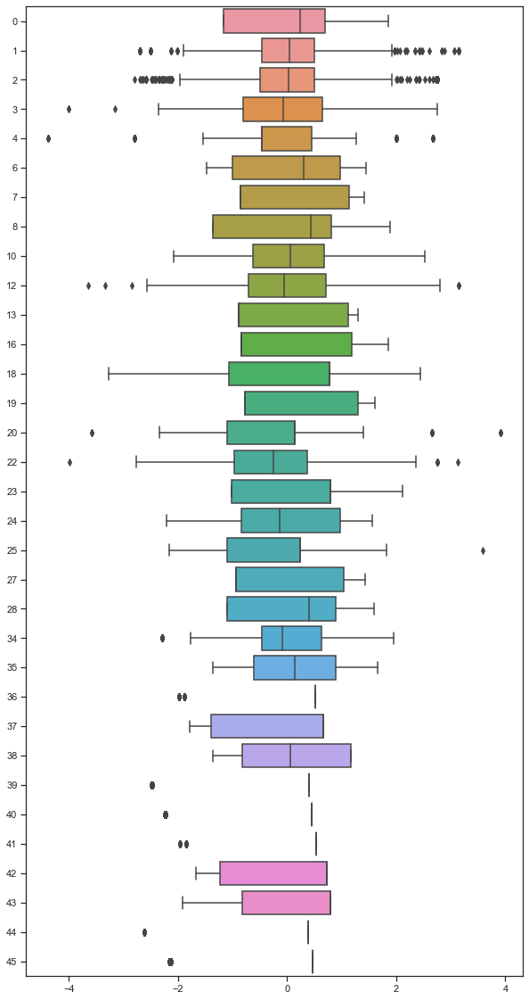

In [601]:
plt.figure(figsize=(10,20))
sns.boxplot(data=X_train, orient="h")

### Observation

There are many variables with outliers:

- 1, 2, 3, 4, 12, 20, 22, 25, 34, 36, 39, 40, 41, 42, 44, & 45

These variable names can be correlated to their original name, when necessary